# Stage 3-2 — Dynamic nested sampling of CASA dirty images

Stage 3-1で保存したdirty cubeを読み、bulge/no-bulge mass modelをDynamic Nested Samplingで比較。ピクセルノイズは相関しているので。evidenceと誤差幅はあくまで近似であることに注意。visibility-domain likelihoodはStage4で扱うがその前段としてテスト。


In [1]:
import os

# Each process runs one dynesty fit; prevent numerical libraries from creating nested thread pools.
os.environ['OMP_NUM_THREADS'] = '1'
os.environ['OPENBLAS_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'

import json
import sys
import time
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from astropy.stats import mad_std
from astropy.table import Table
from dynesty import plotting as dyplot
from cmcrameri import cm

%matplotlib inline

EXAMPLE_DIR = Path.cwd().resolve()
if EXAMPLE_DIR.name == 'examples':
    EXAMPLE_DIR = EXAMPLE_DIR / 'forward_mass'
if not (EXAMPLE_DIR.name == 'forward_mass' and EXAMPLE_DIR.parent.name == 'examples'):
    raise FileNotFoundError('Run this notebook from examples/forward_mass or examples.')
if str(EXAMPLE_DIR) not in sys.path:
    sys.path.insert(0, str(EXAMPLE_DIR))

from glint.context import UVContext, build_finufft_plans, build_uv_layout
from glint.forward import cube_to_visibilities
from glint.inference import (
    make_image_loglikelihood,
    run_dynamic_dynesty_parallel,
)
from glint.interferometer import ARCSEC2RAD, vis_to_image_finufft_type3
from glint.uv_processing import load_processed_uv, load_sigma_scale_extra
import forward_mass_common as fmc

from glint.plotstyle import set_my_plot_style
set_my_plot_style()

## Diagnostic plotting helpers

These helper functions are defined before the experiment setup and called after sampling or cache loading. Generated files are written under `output/stage3/results/`.

In [2]:
def save_dynesty_diagnostic_plots():
    # runplotはevidenceの収束過程、cornerplotはposteriorとparameter縮退を確認する。
    for case in CASES:
        for model_name in ('no_bulge', 'bulge'):
            result = RESULTS[case['name']][model_name]
            result_dir = FIGURE_DIR / case['name'] / model_name
            result_dir.mkdir(parents=True, exist_ok=True)

            run_figure, _ = dyplot.runplot(result['results'], color='tab:blue', logplot=True)
            run_figure.suptitle(f"{case['name']} — {model_name}")
            run_path = result_dir / 'dynesty_runplot.pdf'
            run_figure.savefig(run_path, bbox_inches='tight')
            plt.close(run_figure)

            parameter_names = MODEL_FREE_NAMES[model_name]
            case_truth = truth_parameters(case)
            truths = [getattr(case_truth, name) for name in parameter_names]
            corner_figure, _ = dyplot.cornerplot(
                result['results'], labels=parameter_names, truths=truths,
                truth_color='tab:red', color='black', show_titles=True,
            )
            corner_figure.suptitle(f"{case['name']} — {model_name}")
            corner_path = result_dir / 'dynesty_cornerplot.pdf'
            corner_figure.savefig(corner_path, bbox_inches='tight')
            plt.close(corner_figure)
            print(f'saved {run_path.relative_to(EXAMPLE_DIR)} and {corner_path.relative_to(EXAMPLE_DIR)}')

### Channel-map and residual helper

The channel-map helper also computes reduced $\chi^2$ and standardized-residual statistics for every case/model.

In [3]:
import io

from matplotlib.patches import Ellipse
from PIL import Image
from glint.interferometer import beam_fwhm_ellipse

def flatten_selected_visibilities(array, context):
    """Flatten channel/row visibilities using the context's flag and slices."""
    output = np.empty(context.Ntot, dtype=np.asarray(array).dtype)
    for channel, output_slice in enumerate(context.slices):
        if output_slice is not None:
            output[output_slice] = np.asarray(array)[channel, ~context.flag[channel]]
    return output


def build_diagnostic_uv_context(uv, eps=1e-6):
    """Build the same direct-NUFFT sampling operator for observed and model data."""
    flag = np.asarray(uv.flag, dtype=bool)
    k_list, slices, ntotal = build_uv_layout(
        np.asarray(uv.uvw_lam)[0], np.asarray(uv.uvw_lam)[1], flag,
    )
    l_rad = (XX_IMAGE_ARCSEC * ARCSEC2RAD).ravel().astype(np.float32)
    m_rad = (YY_IMAGE_ARCSEC * ARCSEC2RAD).ravel().astype(np.float32)
    plans = build_finufft_plans(k_list, l_rad, m_rad, eps=eps)
    radius = np.hypot(XX_IMAGE_ARCSEC, YY_IMAGE_ARCSEC)
    pb = np.exp(
        -4.0 * np.log(2.0)
        * radius[None]**2 / np.asarray(uv.pb_fwhm_as)[:, None, None]**2
    )
    return UVContext(
        pb=pb, plans=plans, slices=slices,
        nchan=uv.nchan, Ntot=ntotal, flag=flag,
    )


def diagnostic_dirty_cube(flat_visibilities, uv, context, eps=1e-6, return_beam=False):
    """Image selected visibilities with identical sampling and natural weighting."""
    cube = np.empty((context.nchan, *XX_IMAGE_ARCSEC.shape), dtype=float)
    beams = np.empty_like(cube) if return_beam else None
    for channel, output_slice in enumerate(context.slices):
        if output_slice is None:
            cube[channel] = np.nan
            if return_beam:
                beams[channel] = np.nan
            continue
        selected = ~context.flag[channel]
        sigma = np.asarray(uv.sigma)[channel, selected]
        weight = 1.0 / sigma**2
        cube[channel], beam = vis_to_image_finufft_type3(
            np.asarray(uv.uvw_lam)[0, channel, selected],
            np.asarray(uv.uvw_lam)[1, channel, selected],
            flat_visibilities[output_slice], weight,
            XX_IMAGE_ARCSEC, YY_IMAGE_ARCSEC, eps=eps,
        )
        if return_beam:
            beams[channel] = beam
    return (cube, beams) if return_beam else cube


def diagnostic_model_visibilities(parameters, model, mock, context):
    """Evaluate the best-fit sky directly at the observed uv coordinates."""
    return model.make_visibilities(parameters, context, scale=mock['flux_scale'])


def save_channel_diagnostics():
    """Save all-channel direct-NUFFT comparisons without reading tclean images."""
    diagnostic_rows = []
    image_extent = [
        XX_IMAGE_ARCSEC.min(), XX_IMAGE_ARCSEC.max(),
        YY_IMAGE_ARCSEC.min(), YY_IMAGE_ARCSEC.max(),
    ]
    source_extent = [
        XX_SOURCE_ARCSEC.min(), XX_SOURCE_ARCSEC.max(),
        YY_SOURCE_ARCSEC.min(), YY_SOURCE_ARCSEC.max(),
    ]

    for case in CASES:
        case_name = case['name']
        mock = MOCKS[case_name]
        uv = mock['uv']
        context = build_diagnostic_uv_context(uv)
        observed_vis = flatten_selected_visibilities(uv.data, context)
        signal_vis = flatten_selected_visibilities(mock['signal_uv'].data, context)
        # npzにはline-free channelが残っていないので、3-1がfull-bandから記録したscaleを使う。
        uv_sigma_scale = mock['sigma_scale_linefree']
        sigma_vis = uv_sigma_scale * flatten_selected_visibilities(uv.sigma, context)
        observed_dirty, beam_cube = diagnostic_dirty_cube(
            observed_vis, uv, context, return_beam=True,
        )
        noise_dirty = diagnostic_dirty_cube(observed_vis - signal_vis, uv, context)
        noise_rms = np.asarray([mad_std(channel, ignore_nan=True) for channel in noise_dirty])
        fallback_rms = np.nanstd(noise_dirty, axis=(1, 2))
        noise_rms = np.where(
            np.isfinite(noise_rms) & (noise_rms > 0), noise_rms, fallback_rms,
        )
        beam_ellipses = [beam_fwhm_ellipse(beam_cube[channel], BASE_MODEL.pixsize_img)
                         for channel in range(context.nchan)]

        for model_name in ('no_bulge', 'bulge'):
            result = RESULTS[case_name][model_name]
            best = result['best_parameters']
            # Best-fit lensのcritical lines/causticsを白線で重ねる（全channel共通）。
            critical_lines, caustics = MODELS[case_name].critical_lines_and_caustics(best)
            source_cube = VIS_MODEL.make_intrinsic_cube(best)
            model_vis = diagnostic_model_visibilities(best, VIS_MODEL, mock, context)
            model_dirty = diagnostic_dirty_cube(model_vis, uv, context)
            residual_dirty = observed_dirty - model_dirty

            # Stage 3 sampling used the approximate CASA dirty-image likelihood.
            fit_model_cube = MODELS[case_name].make_convolved_lensed_cube(
                best, scale=mock['flux_scale'], primary_beam=mock['primary_beam'],
            )
            fitted_residual = (
                (mock['data_cube'] - fit_model_cube) / mock['noise_sigma']
            )[FIT_MASK]
            n_parameters = len(MODEL_FREE_NAMES[model_name])
            image_dof = fitted_residual.size - n_parameters
            image_chi2 = float(np.sum(fitted_residual**2))
            image_reduced_chi2 = image_chi2 / image_dof

            # This visibility chi-square is an independent diagnostic, not the sampled likelihood.
            visibility_chi2 = float(np.sum(np.abs((observed_vis - model_vis) / sigma_vis)**2))
            visibility_dof = 2 * observed_vis.size - n_parameters
            visibility_reduced_chi2 = visibility_chi2 / visibility_dof
            diagnostic_rows.append((
                case_name, model_name,
                image_chi2, image_dof, image_reduced_chi2,
                visibility_chi2, visibility_dof, visibility_reduced_chi2, uv_sigma_scale,
                float(np.mean(fitted_residual)), float(np.std(fitted_residual)),
            ))

            result_dir = FIGURE_DIR / case_name / model_name
            result_dir.mkdir(parents=True, exist_ok=True)
            n_channels = uv.nchan
            # パネルを正確に正方形・隙間ゼロで敷き詰める（上端の帯はタイトル用）。
            panel_inches = 1.65
            top_fraction = 0.985
            figure, axes = plt.subplots(
                n_channels, 4,
                figsize=(4 * panel_inches, n_channels * panel_inches / top_fraction),
                squeeze=False,
            )
            figure.subplots_adjust(left=0.0, right=1.0, bottom=0.0, top=top_fraction,
                                   wspace=0.0, hspace=0.0)
            image_vmin = -2.0 * float(np.nanmedian(noise_rms))
            image_vmax = 0.9 * max(
                float(np.nanmax(observed_dirty)), float(np.nanmax(model_dirty)),
            )
            source_vmax = float(np.nanmax(source_cube))

            for channel, velocity_kms in enumerate(np.asarray(uv.v_kms)):
                # The first three panels intentionally share colormap and color limits.
                panels = (
                    (observed_dirty[channel], image_vmin, image_vmax, image_extent),
                    (model_dirty[channel], image_vmin, image_vmax, image_extent),
                    (residual_dirty[channel], image_vmin, image_vmax, image_extent),
                    (source_cube[channel], 0.0, source_vmax, source_extent),
                )
                for column, (panel, vmin, vmax, extent) in enumerate(panels):
                    axes[channel, column].imshow(
                        panel, origin='lower', extent=extent,
                        cmap=cm.roma_r, vmin=vmin, vmax=vmax,
                    )
                    axes[channel, column].set_xticks([])
                    axes[channel, column].set_yticks([])

                # ±[3,9,15,21,27]σのcontour（負側は破線）
                snr_levels = np.array([3.0, 9.0, 15.0, 21.0, 27.0])
                for column, image in ((0, observed_dirty[channel]),
                                      (1, model_dirty[channel]),
                                      (2, residual_dirty[channel])):
                    snr_map = image / noise_rms[channel]
                    levels = np.concatenate([-snr_levels[::-1], snr_levels])
                    inside = (levels >= np.nanmin(snr_map)) & (levels <= np.nanmax(snr_map))
                    if np.any(inside):
                        axes[channel, column].contour(
                            snr_map, levels=levels[inside],
                            colors='black', linewidths=0.25, alpha=0.55,
                            linestyles=['dashed' if level < 0 else 'solid'
                                        for level in levels[inside]],
                            origin='lower', extent=image_extent,
                        )
                    # 各パネル右下にpeak S/N（|S/N|の最大）を「XX σ」形式で示す
                    axes[channel, column].text(
                        0.97, 0.04, f'{np.nanmax(np.abs(snr_map)):.1f}' + r'$\sigma$',
                        transform=axes[channel, column].transAxes,
                        color='white', fontsize=9, ha='right', va='bottom',
                    )
                # 左下に合成ビーム（dirty beam主ローブの半値楕円）を白塗りで示す。
                beam_major, beam_minor, beam_angle = beam_ellipses[channel]
                for column in (0, 1, 2):
                    axes[channel, column].add_patch(Ellipse(
                        (image_extent[0] + 0.10 * (image_extent[1] - image_extent[0]),
                         image_extent[2] + 0.10 * (image_extent[3] - image_extent[2])),
                        width=beam_major, height=beam_minor, angle=beam_angle,
                        facecolor='white', edgecolor='white', lw=0,
                    ))
                for column in (0, 1, 2):
                    for curve in critical_lines:
                        axes[channel, column].plot(
                            curve[:, 0], curve[:, 1],
                            color='white', lw=0.4, alpha=0.9,
                        )
                    axes[channel, column].set_xlim(image_extent[0], image_extent[1])
                    axes[channel, column].set_ylim(image_extent[2], image_extent[3])
                for curve in caustics:
                    axes[channel, 3].plot(
                        curve[:, 0], curve[:, 1],
                        color='white', lw=0.4, alpha=0.9,
                    )
                axes[channel, 3].set_xlim(source_extent[0], source_extent[1])
                axes[channel, 3].set_ylim(source_extent[2], source_extent[3])
                axes[channel, 0].text(
                    0.03, 0.95, f'{velocity_kms:+.0f} km/s',
                    transform=axes[channel, 0].transAxes,
                    color='white', fontsize=12, va='top',
                )

            titles = (
                'Truth / observed dirty', 'Best-fit model dirty',
                'Residual dirty', 'Best-fit intrinsic source',
            )
            for axis_object, title in zip(axes[0], titles, strict=True):
                axis_object.set_title(title, fontsize=9)
            figure.suptitle(
                f'{case_name} — {model_name}; Stage 3 reduced $\\chi^2$={image_reduced_chi2:.3f}',
                fontsize=10, y=0.995,
            )
            channel_path = result_dir / 'all_channel_dirty_comparison.pdf'
            figure.savefig(channel_path, bbox_inches='tight', pad_inches=0.03)
            # ぱらぱら漫画GIF: 上の全channel図と同一の描画を行ごとに切り出し、速度昇順のframeにする。
            # tight bboxなしで描画するとレイアウト座標（top_fraction・等分行）が既知になり、正確に切り出せる。
            buffer = io.BytesIO()
            figure.savefig(buffer, format='png', dpi=150)
            buffer.seek(0)
            page = Image.open(buffer).convert('RGB')
            page_width, page_height = page.size
            header_height = int(round(page_height * (1.0 - top_fraction)))
            # frameはタイトル帯なしの4パネル行のみ（速度ラベルはパネル内にある）。GIFだけ保存する。
            row_height = int((page_height - header_height) / n_channels)
            frames = []
            for channel in range(n_channels):
                y0 = header_height + int(round(channel * (page_height - header_height) / n_channels))
                frames.append(page.crop((0, y0, page_width, y0 + row_height)))
            gif_path = result_dir / 'all_channel_dirty_comparison.gif'
            frames[0].save(gif_path, save_all=True, append_images=frames[1:], duration=300, loop=0)
            print(f'saved {gif_path.relative_to(EXAMPLE_DIR)}')
            plt.close(figure)
            print(f'saved {channel_path.relative_to(EXAMPLE_DIR)}')

    diagnostics = Table(
        rows=diagnostic_rows,
        names=(
            'case', 'model',
            'image_chi2', 'image_dof', 'image_reduced_chi2',
            'visibility_chi2', 'visibility_dof', 'visibility_reduced_chi2', 'uv_sigma_scale',
            'image_residual_mean_sigma', 'image_residual_std_sigma',
        ),
    )
    for name in diagnostics.colnames[2:]:
        diagnostics[name].format = '.5g'
    diagnostics_path = OUTPUT_DIR / 'fit_diagnostics.csv'
    diagnostics.write(diagnostics_path, format='ascii.csv', overwrite=True)
    display(diagnostics)
    print(f'saved {diagnostics_path.relative_to(EXAMPLE_DIR)}')
    return diagnostics


## Configuration, independent source/image grids, and fit mask


In [4]:
# mock_truth.tomlは全Stage共通、mock_stage3.tomlはALMA観測・dirty-image fit設定のみ。
TRUTH_CONFIG = fmc.load_toml(EXAMPLE_DIR / 'mock_truth.toml')
CONFIG = fmc.load_toml(EXAMPLE_DIR / 'mock_stage3.toml')

dynesty_cfg = CONFIG['dynesty']
parallel_cfg = CONFIG['parallel']
DYNESTY_WORKERS_PER_FIT = int(parallel_cfg.get('dynesty_workers_per_fit', 1))
if DYNESTY_WORKERS_PER_FIT < 1:
    raise ValueError('dynesty_workers_per_fit must be >= 1')
OUTPUT_DIR = EXAMPLE_DIR / 'output' / 'stage3' / 'results'
CACHE_DIR = OUTPUT_DIR / 'cache'
FIGURE_DIR = OUTPUT_DIR / 'figures'
CACHE_DIR.mkdir(parents=True, exist_ok=True)
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

MODEL_FREE_NAMES = {
    'bulge': tuple(CONFIG['fit']['free_parameters_bulge']),
    'no_bulge': tuple(CONFIG['fit']['free_parameters_no_bulge']),
}
BOUNDS = CONFIG['fit']['bounds']

# 幾何・スペクトル・モデル仮定の共通部分（beamはcaseごとに違うので後で持たせる）。
BASE_MODEL = fmc.build_forward_model(TRUTH_CONFIG, CONFIG)
# npzはline channelのみ（3-1が両端のline-free channelを落とす）なので、
# visibility診断用には同数削ったchannel gridのモデルを別に持つ（dirty imageのfitは全channelのまま）。
VIS_MODEL = fmc.build_forward_model(
    TRUTH_CONFIG, CONFIG,
    drop_edge_channels=int(CONFIG['image_fit']['line_free_edge_channels']),
)
XX_SOURCE_ARCSEC, YY_SOURCE_ARCSEC = BASE_MODEL.xx_src, BASE_MODEL.yy_src
XX_IMAGE_ARCSEC, YY_IMAGE_ARCSEC = BASE_MODEL.xx_img, BASE_MODEL.yy_img
RADIUS_KPC = BASE_MODEL.radius_kpc
VELOCITY_CHANNELS_KMS = BASE_MODEL.vchan_kms

# Sourceを含む領域だけをfitし、空のdirty-image pixelを過剰に数えない。
SPATIAL_MASK = np.hypot(XX_IMAGE_ARCSEC, YY_IMAGE_ARCSEC) <= CONFIG['image_fit']['fit_radius_arcsec']
FIT_MASK = np.broadcast_to(SPATIAL_MASK, (BASE_MODEL.nchan, *SPATIAL_MASK.shape))
axis = XX_IMAGE_ARCSEC[0]

print(f'z={TRUTH_CONFIG["target"]["redshift"]:.3f}, scale={BASE_MODEL.kpc_per_arcsec:.4f} kpc/arcsec')
print(f'source cube={BASE_MODEL.nchan} x {XX_SOURCE_ARCSEC.shape[0]} x {XX_SOURCE_ARCSEC.shape[1]}')
print(f'image cube={BASE_MODEL.nchan} x {BASE_MODEL.img_shape[0]} x {BASE_MODEL.img_shape[1]}')
print(f'fitted voxels={FIT_MASK.sum():,}; dirty products are loaded below')
print(f'dynamic dynesty: nlive_init={dynesty_cfg["nlive_init"]}, nlive_batch={dynesty_cfg["nlive_batch"]}, pfrac={dynesty_cfg["pfrac"]}')
print(f'parallel: up to {parallel_cfg["max_workers"]} fits, '
      f'{DYNESTY_WORKERS_PER_FIT} Dynesty workers/fit')


z=6.024, scale=5.6972 kpc/arcsec
source cube=33 x 200 x 200
image cube=33 x 200 x 200
fitted voxels=720,093; dirty products are loaded below
dynamic dynesty: nlive_init=150, nlive_batch=100, pfrac=0.5
parallel: up to 16 fits, 2 Dynesty workers/fit


## Cases and free-lens forward model


In [5]:
CASES = fmc.make_cases(TRUTH_CONFIG)


def truth_parameters(case):
    return fmc.truth_parameters(case, TRUTH_CONFIG)


# Forward chainの実体（intrinsic→lensed→convolved）はglint.forward.ForwardModelへ移した。
# Dirty PSFはcaseごとに違うので、caseごとのForwardModelをcell 11で構築する。
def rotation_curve(parameters):
    # Plot用にdisk・bulge・halo・totalの円運動速度を個別に返す。
    return BASE_MODEL.rotation_curve(parameters)


Table(rows=[(c['name'], c['bulge_to_total'], c['bulge_effective_radius_kpc']) for c in CASES], names=('case', 'B/T', 'Re_bulge_kpc'))


case,B/T,Re_bulge_kpc
str9,float64,float64
bt10_re03,0.1,0.3
bt10_re06,0.1,0.6
bt25_re03,0.25,0.3
bt25_re06,0.25,0.6
bt50_re03,0.5,0.3
bt50_re06,0.5,0.6
bt00,0.0,nan


## Load the fixed CASA dirty-image realizations


In [6]:
REFERENCE_FREQUENCY_HZ = (
    float(TRUTH_CONFIG['line']['rest_frequency_hz'])
    / (1.0 + float(TRUTH_CONFIG['target']['redshift']))
)
PRODUCT_DIR = EXAMPLE_DIR / 'output' / 'stage3' / 'products'
CASA_WORK_DIR = EXAMPLE_DIR / 'output' / 'stage3' / 'casa_work'
MOCKS = {}
MODELS = {}
for case in CASES:
    product_dir = PRODUCT_DIR / case['name']
    work_dir = CASA_WORK_DIR / case['name'] / 'simulation'
    required = (
        product_dir / 'dirty.image.fits', product_dir / 'dirty.psf.fits',
        product_dir / 'sn_normalization.json', work_dir / 'uv_data.npz',
        work_dir / 'signal_uv_data.npz',
    )
    missing = [str(path) for path in required if not path.exists()]
    if missing:
        raise FileNotFoundError(f'Run Stage 3-1 first; missing products: {missing}')
    data_cube, velocity_kms, header = fmc.load_casa_cube(product_dir / 'dirty.image.fits', REFERENCE_FREQUENCY_HZ)
    psf_cube, psf_velocity_kms, _ = fmc.load_casa_cube(product_dir / 'dirty.psf.fits', REFERENCE_FREQUENCY_HZ)
    if velocity_kms.shape != VELOCITY_CHANNELS_KMS.shape or not np.allclose(velocity_kms, VELOCITY_CHANNELS_KMS, atol=1.0):
        raise ValueError(f'Channel mismatch for {case["name"]}: {velocity_kms}')
    if psf_velocity_kms.shape != VELOCITY_CHANNELS_KMS.shape or not np.allclose(psf_velocity_kms, VELOCITY_CHANNELS_KMS, atol=1.0):
        raise ValueError(f'PSF channel mismatch for {case["name"]}')
    uv = load_processed_uv(work_dir / 'uv_data.npz', sort_channels_by_velocity=True)
    signal_uv = load_processed_uv(work_dir / 'signal_uv_data.npz', sort_channels_by_velocity=True)
    if (
        signal_uv.data.shape != uv.data.shape
        or not np.allclose(signal_uv.uvw_lam, uv.uvw_lam)
        or not np.array_equal(signal_uv.flag, uv.flag)
    ):
        raise ValueError(f'Noisy/signal UV products differ for {case["name"]}')
    if uv.nchan != VIS_MODEL.nchan or not np.allclose(uv.v_kms, VIS_MODEL.vchan_kms, atol=1.0):
        raise ValueError(f'UV channel mismatch for {case["name"]}: {uv.v_kms}')
    normalization = json.loads((product_dir / 'sn_normalization.json').read_text())
    flux_scale = float(normalization['flux_scale'])
    psf_cube = fmc.normalize_dirty_psf(psf_cube)
    # Dirty beamはcase固有なので、caseごとのForwardModelがbeam FFTをcacheする。
    MODELS[case['name']] = fmc.build_forward_model(TRUTH_CONFIG, CONFIG, beam=psf_cube)
    MOCKS[case['name']] = {
        'data_cube': data_cube,
        'uv': uv,
        'signal_uv': signal_uv,
        'psf_cube': psf_cube,
        'primary_beam': fmc.primary_beam_from_uv_product(XX_IMAGE_ARCSEC, YY_IMAGE_ARCSEC, uv),
        'flux_scale': flux_scale,
        # 3-1がfull-bandのline-freeから測ってnpzへ記録したσ scale（fitと同じ較正）。
        'sigma_scale_linefree': float(
            load_sigma_scale_extra(work_dir / 'uv_data.npz')['sigma_scale_linefree']),
        'noise_sigma': fmc.robust_dirty_rms(data_cube, CONFIG['image_fit']['line_free_edge_channels']),
        'header': header,
        'product_dir': product_dir,
        'work_dir': work_dir,
    }
for case in CASES:
    mock = MOCKS[case['name']]
    mock['noiseless_cube'] = MODELS[case['name']].make_convolved_lensed_cube(
        truth_parameters(case), scale=mock['flux_scale'],
        primary_beam=mock['primary_beam'],
    )
    print(case['name'], f'dirty RMS={mock["noise_sigma"]:.4g} Jy/beam')


bt10_re03 dirty RMS=0.000208 Jy/beam
bt10_re06 dirty RMS=0.0002054 Jy/beam
bt25_re03 dirty RMS=0.0002136 Jy/beam


bt25_re06 dirty RMS=0.0002089 Jy/beam
bt50_re03 dirty RMS=0.0002164 Jy/beam
bt50_re06 dirty RMS=0.0002112 Jy/beam


bt00 dirty RMS=0.0002113 Jy/beam


## Mock channel maps

All velocity channels are shown for every physical case before fitting.


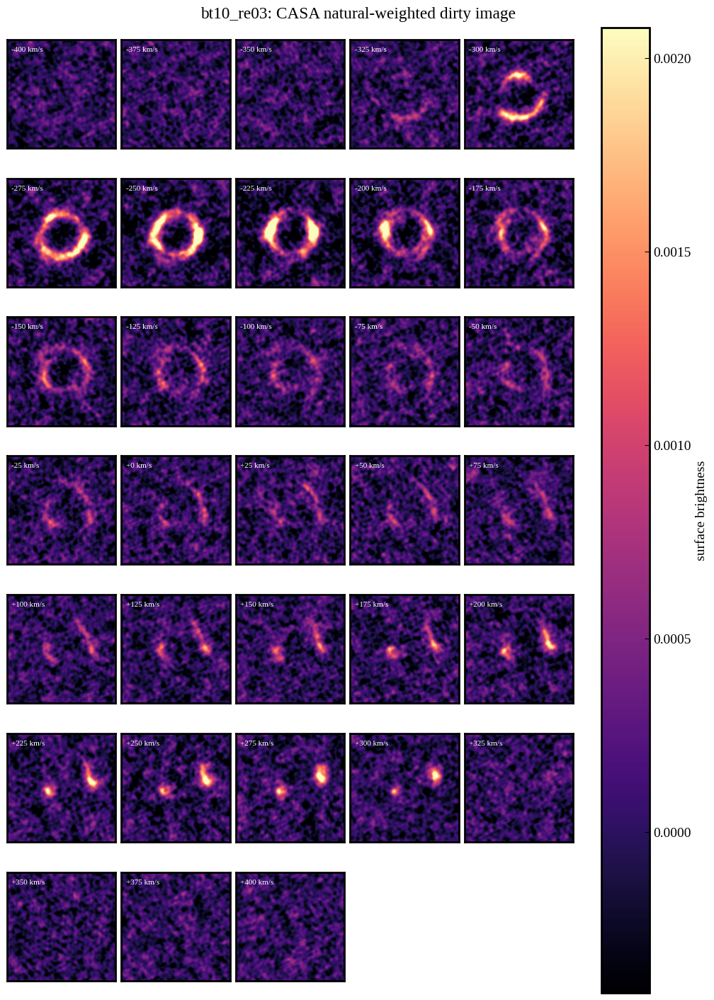

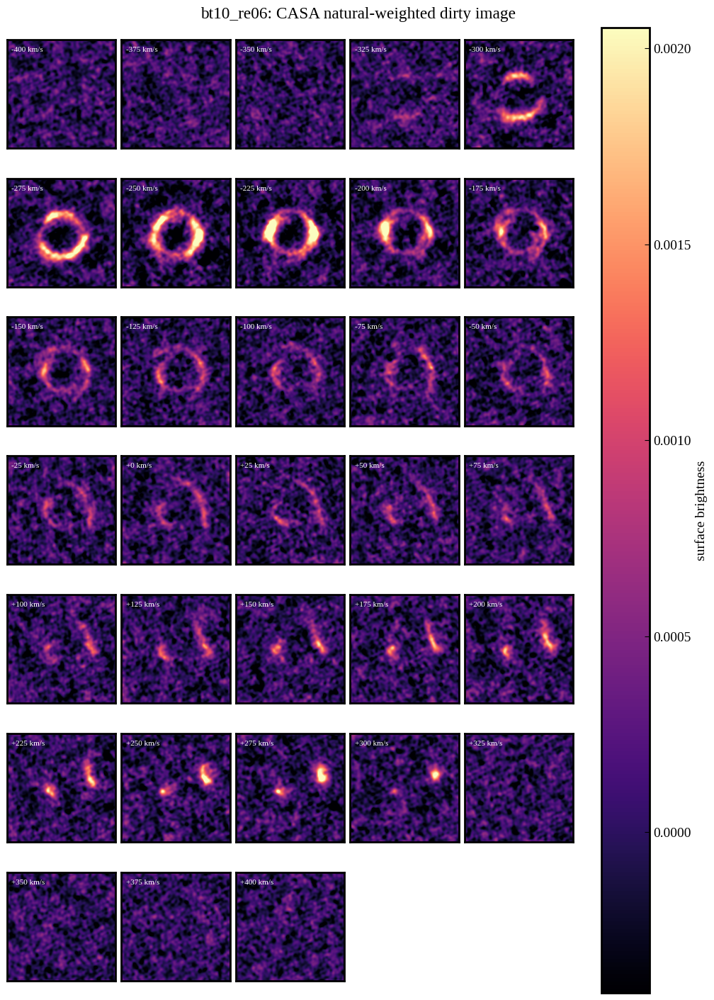

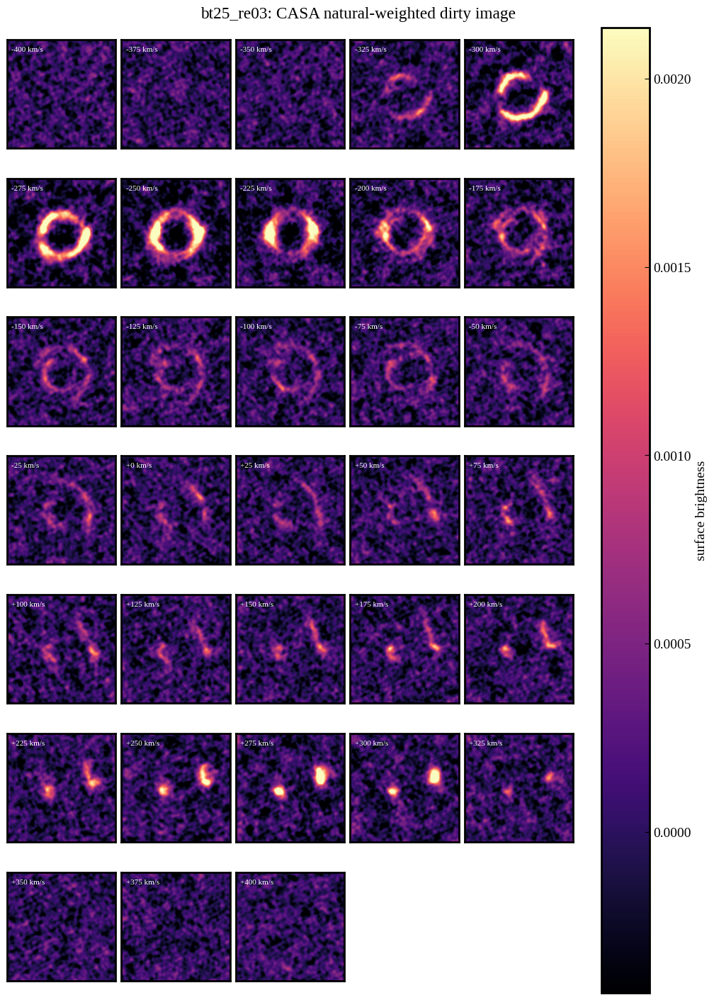

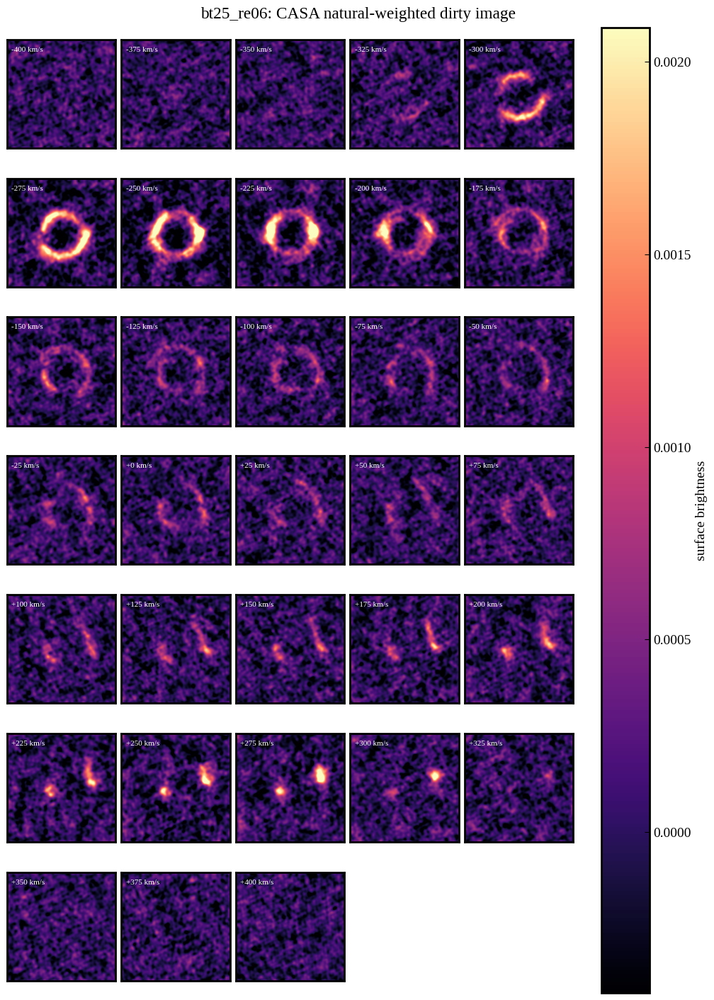

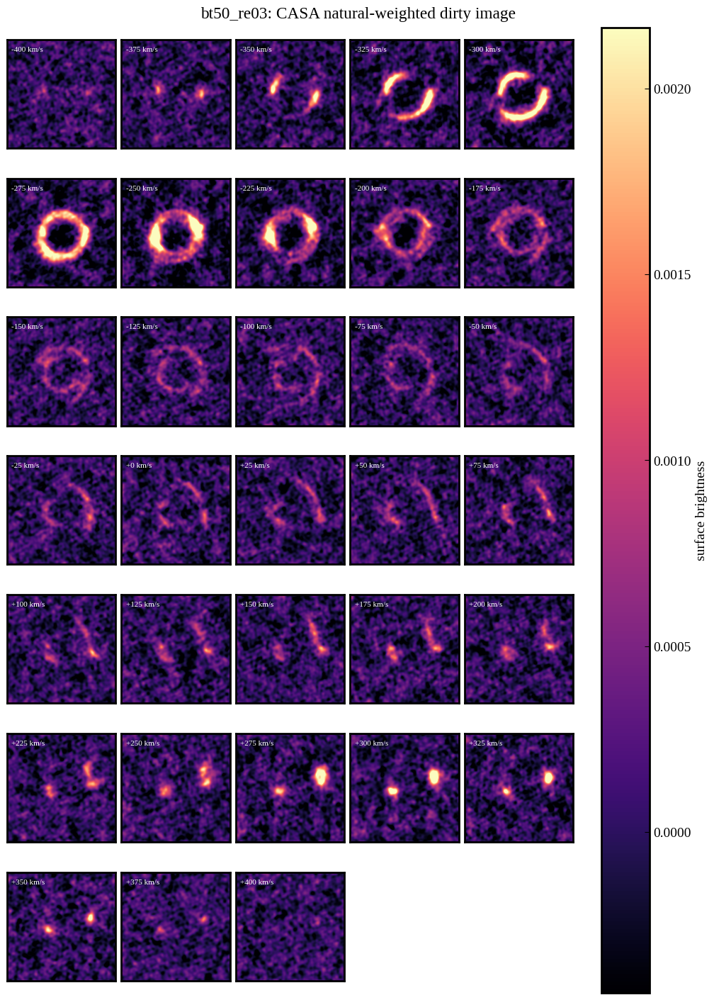

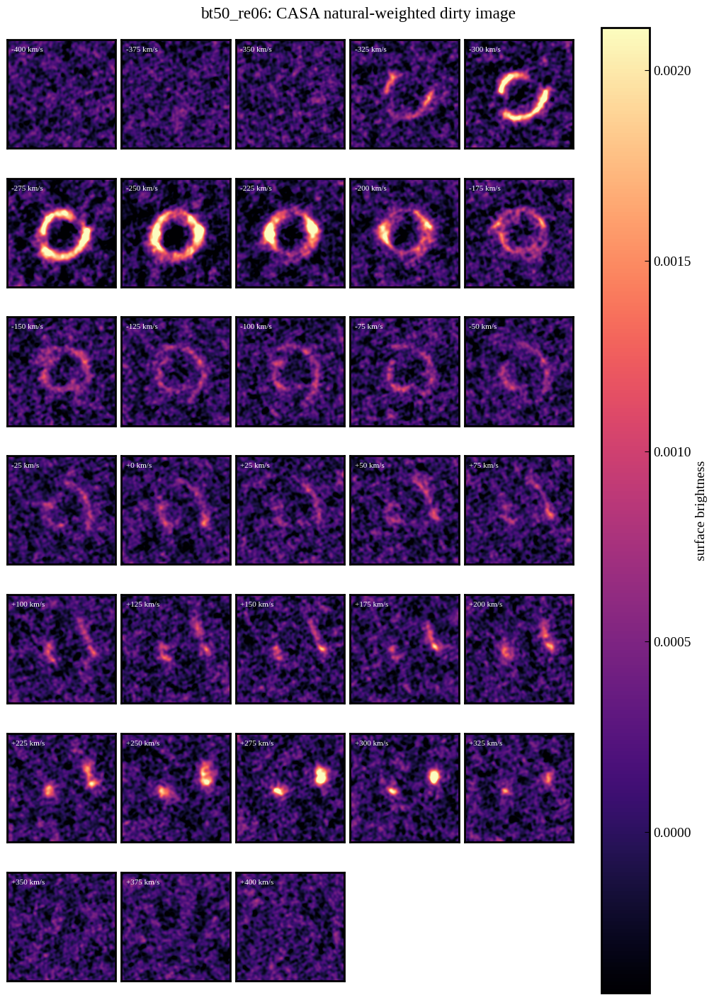

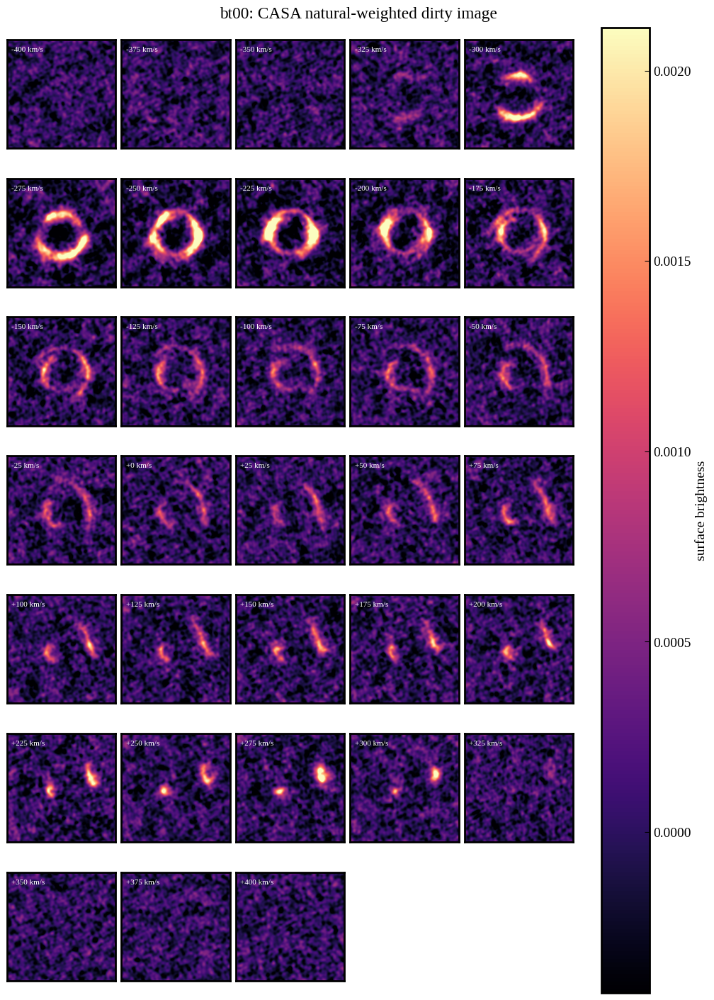

In [7]:
def plot_mock_channel_maps(cube, case_name, noise_sigma, label, ncols=5):
    nchan = cube.shape[0]
    nrows = int(np.ceil(nchan / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(2 * ncols, 2 * nrows), constrained_layout=True)
    axes = np.atleast_1d(axes).ravel()
    image = None
    for index, ax in enumerate(axes):
        if index >= nchan:
            ax.set_visible(False)
            continue
        image = ax.imshow(
            cube[index], origin='lower', cmap='magma',
            vmin=-2.0 * noise_sigma, vmax=10.0 * noise_sigma,
            extent=(axis[0], axis[-1], axis[0], axis[-1]),
        )
        ax.text(0.04, 0.94, f'{VELOCITY_CHANNELS_KMS[index]:+.0f} km/s',
                transform=ax.transAxes, ha='left', va='top', color='white', fontsize=8)
        ax.set_xticks([])
        ax.set_yticks([])
    fig.colorbar(image, ax=axes[:nchan].tolist(), label='surface brightness')
    fig.suptitle(f'{case_name}: {label}')
    plt.show()

for case in CASES:
    mock = MOCKS[case['name']]
    plot_mock_channel_maps(
        mock['data_cube'], case['name'], mock['noise_sigma'],
        label='CASA natural-weighted dirty image',
    )


## Approximate dirty-image likelihood and timing benchmark

RMSはline-free edge channelsからMADで測ります。Pixel間相関を無視するため、reduced χ²やevidenceの絶対値を厳密な統計量として解釈しません。


In [8]:
PARAMETER_LAYOUTS = fmc.build_parameter_layouts(CASES, MODEL_FREE_NAMES, BOUNDS, TRUTH_CONFIG)
REFERENCE_LAYOUTS = {
    model_name: PARAMETER_LAYOUTS[(CASES[0]['name'], model_name)]
    for model_name in MODEL_FREE_NAMES
}

def prior_transform(unit_cube, model_name):
    # dynestyの単位cube [0, 1]を、TOMLで指定した一様priorへ変換する。
    return REFERENCE_LAYOUTS[model_name].prior_transform(unit_cube)

def make_loglikelihood(case, model_name):
    # Dirty-image pixel相関を無視した近似Gaussian likelihood。
    mock = MOCKS[case['name']]
    return make_image_loglikelihood(
        MODELS[case['name']], PARAMETER_LAYOUTS[(case['name'], model_name)],
        mock['data_cube'], mock['noise_sigma'], FIT_MASK,
        scale=mock['flux_scale'], primary_beam=mock['primary_beam'],
    )

benchmark_loglike = make_loglikelihood(CASES[0], 'bulge')
benchmark_rng = np.random.default_rng(1234)
benchmark_points = [prior_transform(benchmark_rng.random(len(MODEL_FREE_NAMES['bulge'])), 'bulge') for _ in range(30)]
start = time.perf_counter()
for point in benchmark_points:
    benchmark_loglike(point)
SECONDS_PER_LOGLIKE = (time.perf_counter() - start) / len(benchmark_points)
print(f'{1e3 * SECONDS_PER_LOGLIKE:.2f} ms per likelihood evaluation ({1/SECONDS_PER_LOGLIKE:.1f} evaluations/s, one core)')


79.70 ms per likelihood evaluation (12.5 evaluations/s, one core)


## Dynamic nested sampling

並列sampling中は、先頭のcache-miss fitだけDynesty標準のprogress barを代表として表示する。


In [9]:
def run_nested_fit(case, model_name, task_seed, show_progress=False):
    names = MODEL_FREE_NAMES[model_name]
    start = time.perf_counter()
    # 1 fit内のproposal/likelihood評価をthread poolへ流す。
    # PSF FFTは読み取り専用なので、全threadが同じloglikelihoodを共有できる。
    loglikelihood = make_loglikelihood(case, model_name)
    results = run_dynamic_dynesty_parallel(
        lambda: loglikelihood, lambda u: prior_transform(u, model_name), len(names),
        workers=DYNESTY_WORKERS_PER_FIT,
        nlive_init=dynesty_cfg['nlive_init'], nlive_batch=dynesty_cfg['nlive_batch'],
        dlogz_init=dynesty_cfg['dlogz_init'], pfrac=dynesty_cfg['pfrac'],
        evidence_threshold=dynesty_cfg['evidence_threshold'],
        target_n_effective=dynesty_cfg['target_n_effective'],
        max_batches=dynesty_cfg['max_batches'],
        bound=dynesty_cfg['bound'], sample=dynesty_cfg['sample'],
        rstate=np.random.default_rng(np.random.SeedSequence([dynesty_cfg['random_seed'], task_seed])),
        print_progress=show_progress,
    )
    return fmc.summarize_nested_result(
        results, PARAMETER_LAYOUTS[(case['name'], model_name)], names,
        time.perf_counter() - start,
    )

def run_nested_task(task):
    case, model_name, task_seed, show_progress = task
    return case['name'], model_name, run_nested_fit(case, model_name, task_seed, show_progress)

RESULTS = fmc.run_fit_tasks(
    cases=CASES,
    metadata_for=lambda case, model_name: fmc.stage32_sampling_metadata(
        TRUTH_CONFIG, CONFIG, case, model_name,
        MOCKS[case['name']]['product_dir'], MOCKS[case['name']]['work_dir'],
    ),
    run_task=run_nested_task,
    cache_dir=CACHE_DIR,
    env=fmc.stage_environment('STAGE3', len(CASES)),
    parallel_cfg=parallel_cfg,
    workers_per_fit=DYNESTY_WORKERS_PER_FIT,
)


bt10_re03  no_bulge : loaded valid cache
bt10_re03  bulge    : loaded valid cache


bt10_re06  no_bulge : loaded valid cache
bt10_re06  bulge    : loaded valid cache
bt25_re03  no_bulge : loaded valid cache


bt25_re03  bulge    : loaded valid cache
bt25_re06  no_bulge : loaded valid cache


bt25_re06  bulge    : loaded valid cache
bt50_re03  no_bulge : loaded valid cache
bt50_re03  bulge    : loaded valid cache
bt50_re06  no_bulge : loaded valid cache
bt50_re06  bulge    : loaded valid cache
bt00       no_bulge : loaded valid cache


bt00       bulge    : loaded valid cache
all requested fits loaded from valid caches; dynesty sampling skipped
total sampling/cache wall time = 0.00 min


## Evidence and parameter summary

The bulge model uses a continuous prior down to `B/T = 0`. Although its model family approaches the no-bulge model at that boundary, the exact boundary has zero probability under a continuous prior. The evidence therefore remains a meaningful comparison: an unnecessary bulge is penalized through the extra prior volume (the Occam factor). The numerical Bayes factor is nevertheless prior-dependent, so the adopted upper bound and prior shape should be reported and later tested for sensitivity. A positive lower bound would answer a different question—whether a bulge larger than that imposed minimum is required.


case,B/T truth,Re truth [kpc],lnZ no bulge,lnZ bulge,Delta lnZ,Delta lnZ numerical error
str9,float64,float64,float64,float64,float64,float64
bt10_re03,0.100,0.300,5071757.355,5081732.447,9975.092,0.575
bt10_re06,0.100,0.600,5076049.104,5077794.619,1745.515,0.570
bt25_re03,0.250,0.300,5058718.924,5078924.700,20205.776,0.566
bt25_re06,0.250,0.600,5063601.650,5071009.159,7407.509,0.563
bt50_re03,0.500,0.300,5046442.427,5074688.440,28246.012,0.597
bt50_re06,0.500,0.600,5070852.470,5086764.623,15912.153,0.584
bt00,0.000,nan,5073472.691,5073645.955,173.263,0.579


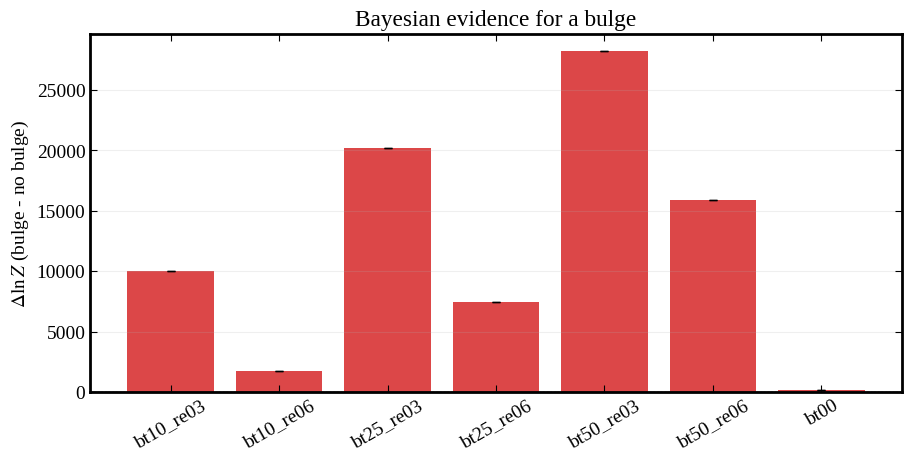

In [10]:
FULL_RESULTS = len(RESULTS) == len(CASES) and all(set(result) == {'no_bulge', 'bulge'} for result in RESULTS.values())
# 全case・両modelが揃ったときだけevidence比較と一括診断を作る。
if FULL_RESULTS:
    rows = []
    for case in CASES:
        no_bulge = RESULTS[case['name']]['no_bulge']
        bulge = RESULTS[case['name']]['bulge']
        rows.append((case['name'], case['bulge_to_total'], case['bulge_effective_radius_kpc'], no_bulge['logz'], bulge['logz'], bulge['logz'] - no_bulge['logz'], np.hypot(no_bulge['logzerr'], bulge['logzerr'])))
        # 独立なlnZ誤差を仮定し、Delta lnZの数値誤差は二乗和平方根で評価する。
    EVIDENCE_TABLE = Table(rows=rows, names=('case', 'B/T truth', 'Re truth [kpc]', 'lnZ no bulge', 'lnZ bulge', 'Delta lnZ', 'Delta lnZ numerical error'))
    for name in EVIDENCE_TABLE.colnames[1:]: EVIDENCE_TABLE[name].format = '.3f'
    display(EVIDENCE_TABLE)

    fig, ax = plt.subplots(figsize=(9, 4.5), constrained_layout=True)
    delta = np.asarray(EVIDENCE_TABLE['Delta lnZ'])
    error = np.asarray(EVIDENCE_TABLE['Delta lnZ numerical error'])
    colors = ['tab:blue' if value < 2.5 else 'tab:orange' if value < 5 else 'tab:red' for value in delta]
    ax.bar(np.arange(len(CASES)), delta, yerr=error, color=colors, alpha=0.85, capsize=3)
    ax.axhline(0, color='black', lw=1)
    ax.axhline(2.5, color='0.4', lw=1, ls='--')
    ax.axhline(5.0, color='0.4', lw=1, ls=':')
    ax.set_xticks(np.arange(len(CASES)), [case['name'] for case in CASES], rotation=30)
    ax.set_ylabel(r'$\Delta\ln Z$ (bulge - no bulge)')
    ax.set_title('Bayesian evidence for a bulge')
    ax.grid(axis='y', alpha=0.2)
    plt.show()

## Rotation curves and residual diagnostics

Solid black is the truth, red is the maximum-likelihood bulge model, and blue is the maximum-likelihood no-bulge model. Residual moment maps are summed over velocity after subtracting the corresponding convolved model cube.

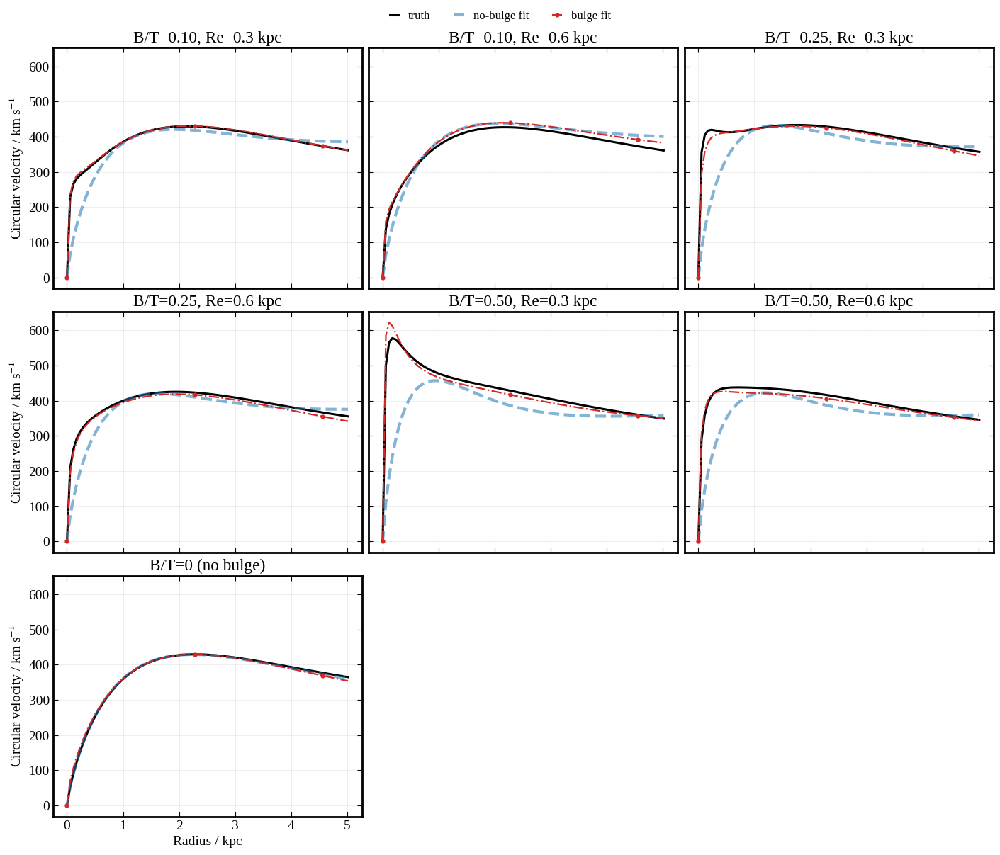

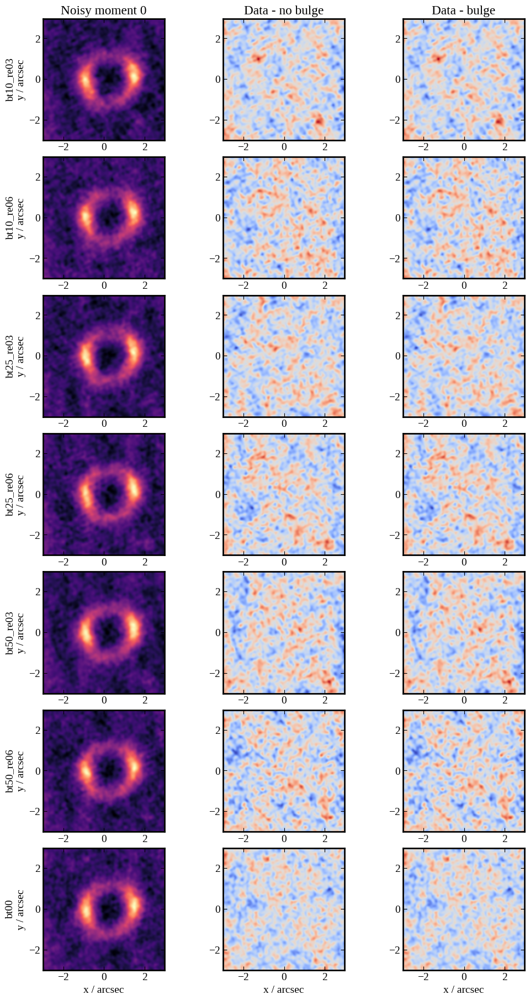

In [11]:
if FULL_RESULTS:
    ncols = 3
    nrows = int(np.ceil(len(CASES) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(14, 4 * nrows), sharex=True, sharey=True, squeeze=False, constrained_layout=True)
    for ax, case in zip(axes.flat, CASES):
        ax.plot(RADIUS_KPC, rotation_curve(truth_parameters(case))['total_kms'], color='black', lw=2.2, label='truth')
        fit_styles = {
            'no_bulge': dict(color='tab:blue', lw=3.0, ls='--', alpha=0.55, zorder=2, label='no-bulge fit'),
            'bulge': dict(color='tab:red', lw=1.6, ls='-.', marker='o', markevery=40, ms=3.5, zorder=3, label='bulge fit'),
        }
        # Draw the broad no-bulge curve first and the marked bulge curve last so coincident fits remain visible.
        for model_name in ('no_bulge', 'bulge'):
            curve = rotation_curve(RESULTS[case['name']][model_name]['best_parameters'])
            ax.plot(RADIUS_KPC, curve['total_kms'], **fit_styles[model_name])
        title = 'B/T=0 (no bulge)' if case['bulge_to_total'] == 0 else f"B/T={case['bulge_to_total']:.2f}, Re={case['bulge_effective_radius_kpc']:.1f} kpc"
        ax.set_title(title)
        ax.grid(alpha=0.2)
    for ax in axes.flat[len(CASES):]: ax.set_visible(False)
    for ax in axes[:, 0]: ax.set_ylabel(r'Circular velocity / km s$^{-1}$')
    for ax in axes[-1]: ax.set_xlabel('Radius / kpc')
    handles, labels = axes.flat[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='outside upper center', ncol=3, frameon=False)
    plt.show()

    fig, axes = plt.subplots(len(CASES), 3, figsize=(10, 18), constrained_layout=True)
    extent = [axis.min(), axis.max(), axis.min(), axis.max()]
    for row, case in enumerate(CASES):
        mock = MOCKS[case['name']]
        data_moment0 = mock['data_cube'].sum(axis=0)
        residuals = {}
        for model_name in ('no_bulge', 'bulge'):
            model_cube = MODELS[case['name']].make_convolved_lensed_cube(
                RESULTS[case['name']][model_name]['best_parameters'],
                scale=MOCKS[case['name']]['flux_scale'],
                primary_beam=MOCKS[case['name']]['primary_beam'],
            )
            residuals[model_name] = (mock['data_cube'] - model_cube).sum(axis=0)
        limit = max(np.max(np.abs(residuals['no_bulge'])), np.max(np.abs(residuals['bulge'])))
        axes[row, 0].imshow(data_moment0, origin='lower', extent=extent, cmap='magma')
        axes[row, 1].imshow(residuals['no_bulge'], origin='lower', extent=extent, cmap='coolwarm', vmin=-limit, vmax=limit)
        axes[row, 2].imshow(residuals['bulge'], origin='lower', extent=extent, cmap='coolwarm', vmin=-limit, vmax=limit)
        axes[row, 0].set_ylabel(case['name'] + '\ny / arcsec')
    for ax, title in zip(axes[0], ('Noisy moment 0', 'Data - no bulge', 'Data - bulge'), strict=True): ax.set_title(title)
    for ax in axes[-1]: ax.set_xlabel('x / arcsec')
    plt.show()

## Saved fit and convergence diagnostics

For every case and model, `dynesty.plotting.runplot`, `cornerplot`, and a full-channel comparison are saved under `output/stage3/results/figures/<case>/<model>/`. Observed, model, and residual dirty images are all made directly from the corresponding visibilities with the same natural weights and NUFFT operator; they do not read CASA `tclean` images. Their colormap and color limits are shared. The source column is the best-fit intrinsic source. `fit_diagnostics.csv` reports both the Stage 3 approximate dirty-image chi-square and an independent visibility-domain chi-square.


In [12]:
if FULL_RESULTS:
    if os.getenv('STAGE3_SKIP_DYNESTY_PLOTS', '0') != '1':
        save_dynesty_diagnostic_plots()
    else:
        print('Dynesty plot regeneration skipped (STAGE3_SKIP_DYNESTY_PLOTS=1).')
    FIT_DIAGNOSTICS = save_channel_diagnostics()

Dynesty plot regeneration skipped (STAGE3_SKIP_DYNESTY_PLOTS=1).


saved output/stage3/results/figures/bt10_re03/no_bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt10_re03/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt10_re03/bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt10_re03/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt10_re06/no_bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt10_re06/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt10_re06/bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt10_re06/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt25_re03/no_bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt25_re03/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt25_re03/bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt25_re03/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt25_re06/no_bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt25_re06/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt25_re06/bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt25_re06/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt50_re03/no_bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt50_re03/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt50_re03/bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt50_re03/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt50_re06/no_bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt50_re06/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt50_re06/bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt50_re06/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt00/no_bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt00/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt00/bulge/all_channel_dirty_comparison.gif
saved output/stage3/results/figures/bt00/bulge/all_channel_dirty_comparison.pdf


case,model,image_chi2,image_dof,image_reduced_chi2,visibility_chi2,visibility_dof,visibility_reduced_chi2,uv_sigma_scale,image_residual_mean_sigma,image_residual_std_sigma
str9,str8,float64,int64,float64,float64,int64,float64,float64,float64,float64
bt10_re03,no_bulge,7.4303e+05,7.2008e+05,1.0319,3.5906e+05,3.5564e+05,1.0096,1.0024,-0.036712,1.0151
bt10_re03,bulge,7.2308e+05,7.2007e+05,1.0042,3.5881e+05,3.5564e+05,1.0089,1.0024,-0.031496,1.0016
bt10_re06,no_bulge,7.5257e+05,7.2008e+05,1.0451,3.5906e+05,3.5564e+05,1.0096,1.0028,-0.012187,1.0222
bt10_re06,bulge,7.4908e+05,7.2007e+05,1.0403,3.5901e+05,3.5564e+05,1.0095,1.0028,-0.0096793,1.0199
bt25_re03,no_bulge,7.3079e+05,7.2008e+05,1.0149,3.5977e+05,3.5564e+05,1.0116,1.0011,-0.018477,1.0072
bt25_re03,bulge,6.9039e+05,7.2007e+05,0.95877,3.591e+05,3.5564e+05,1.0097,1.0011,-0.013311,0.97907
bt25_re06,no_bulge,7.5249e+05,7.2008e+05,1.045,3.5565e+05,3.5564e+05,1,1.0063,-0.027275,1.0219
bt25_re06,bulge,7.3767e+05,7.2007e+05,1.0244,3.554e+05,3.5564e+05,0.99934,1.0063,-0.022518,1.0119
bt50_re03,no_bulge,7.3617e+05,7.2008e+05,1.0224,3.627e+05,3.5564e+05,1.0199,0.99592,-0.0096146,1.0111


saved output/stage3/results/fit_diagnostics.csv


## Interpretation

Bulge/no-bulgeの比較にはevidence、posterior、channel residualを併用します。ただしdirty-image likelihoodは相関noiseを無視しているため、最終判断はvisibility fittingで確認します。
